# Exploring Relationships - Content list

1. Import libraries and data
2. Create a subset for visualizations
3. Correlation matrix heatmap
4. Scatterplots
5. Pair plot
6. Categorical plot
7. Conclusion

# 1. Import libraries and data

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Create path
path = r'C:\Users\Mathilde\Documents\DATA ANALYSIS CAREERFOUNDRY\Aug 2024 - SNCF project'
# Import the merged data set
df = pd.read_csv(os.path.join(path, '02 Data', 'Prepared data', 'df_delay_and_nb_travelers.csv'), index_col = False)

# 2. Create a subset for visualizations

In [3]:
pd.set_option('display.max_columns', None)
df.head(1)

,Unnamed: 0,Date,Service,Departure station,Arrival station,Avg trip length,Number of trips scheduled,Number of trains cancelled,Number of trains delayed on departure,Avg delay of trains delayed on departure,Avg delay of all trains on departure,Number of trains delayed on arrival,Avg delay of trains delayed on arrival,Avg delay of all trains on arrival,Comments delay on arrival,Number of trains >15 min delay,Number of trains >30 min delay,Number of trains >60 min delay,% delay from external causes,% delay infrastructure cause,% delay traffic management cause,% delay rolling stock cause,% delay station management and reutilization of stock,"% delay because of accommodation of passengers (crowd, disability, connections)",Departure region,Arrival region,Departure station: Total travelers 2023,Departure station: Total travelers 2022,Departure station: Total travelers 2021,Departure station: Total travelers 2020,Departure station: Total travelers 2019,Departure station: Total travelers 2018,Arrival station: Total travelers 2023,Arrival station: Total travelers 2022,Arrival station: Total travelers 2021,Arrival station: Total travelers 2020,Arrival station: Total travelers 2019,Arrival station: Total travelers 2018
0,0,2018-01,National,BORDEAUX SAINT-JEAN,PARIS MONTPARNASSE,141,870,5,289,11.247809,3.693179,147,28.436735,6.511118,NaN,110,44,8,36.134454,31.092437,10.92437,15.966387,5.042017,0.840336,Nouvelle-Aquitaine,Ile-de-France,22612374.0,21353889.0,16454662.0,11184093.0,17675655.0,16080989.0,64471254.0,56862435.0,41039816.0,32447396.0,61374056.0,59174533.0


I need to drop categorical variables, as thay will not be able to be processed in the visualizations. However, one of my questions to explore is about regions, and in particular, wether or not Paris stations seem to be better managed than others. I'll create a boolean variable for Paris train stations: 1 if the train station is in Paris and 0 if it is not.

In [4]:
# Creation of Paris flag
# Departure
df['Departure from Paris'] = 0
df.loc[df['Departure station'].isin(['PARIS MONTPARNASSE', 'PARIS EST', 'PARIS VAUGIRARD', 'PARIS LYON', 'PARIS NORD']), 'Departure from Paris'] = 1
# Arrival
df['Paris-bound'] = 0
df.loc[df['Arrival station'].isin(['PARIS MONTPARNASSE', 'PARIS EST', 'PARIS VAUGIRARD', 'PARIS LYON', 'PARIS NORD']), 'Paris-bound'] = 1

In [5]:
sub = df.drop(columns = ['Unnamed: 0', 'Date', 'Service', 'Departure station', 'Arrival station', 'Comments delay on arrival', 'Departure region', 'Arrival region'])

In [6]:
sub.head(1)

,Avg trip length,Number of trips scheduled,Number of trains cancelled,Number of trains delayed on departure,Avg delay of trains delayed on departure,Avg delay of all trains on departure,Number of trains delayed on arrival,Avg delay of trains delayed on arrival,Avg delay of all trains on arrival,Number of trains >15 min delay,Number of trains >30 min delay,Number of trains >60 min delay,% delay from external causes,% delay infrastructure cause,% delay traffic management cause,% delay rolling stock cause,% delay station management and reutilization of stock,"% delay because of accommodation of passengers (crowd, disability, connections)",Departure station: Total travelers 2023,Departure station: Total travelers 2022,Departure station: Total travelers 2021,Departure station: Total travelers 2020,Departure station: Total travelers 2019,Departure station: Total travelers 2018,Arrival station: Total travelers 2023,Arrival station: Total travelers 2022,Arrival station: Total travelers 2021,Arrival station: Total travelers 2020,Arrival station: Total travelers 2019,Arrival station: Total travelers 2018,Departure from Paris,Paris-bound
0,141,870,5,289,11.247809,3.693179,147,28.436735,6.511118,110,44,8,36.134454,31.092437,10.92437,15.966387,5.042017,0.840336,22612374.0,21353889.0,16454662.0,11184093.0,17675655.0,16080989.0,64471254.0,56862435.0,41039816.0,32447396.0,61374056.0,59174533.0,0,1


# 3. Correlation matrix heatmap

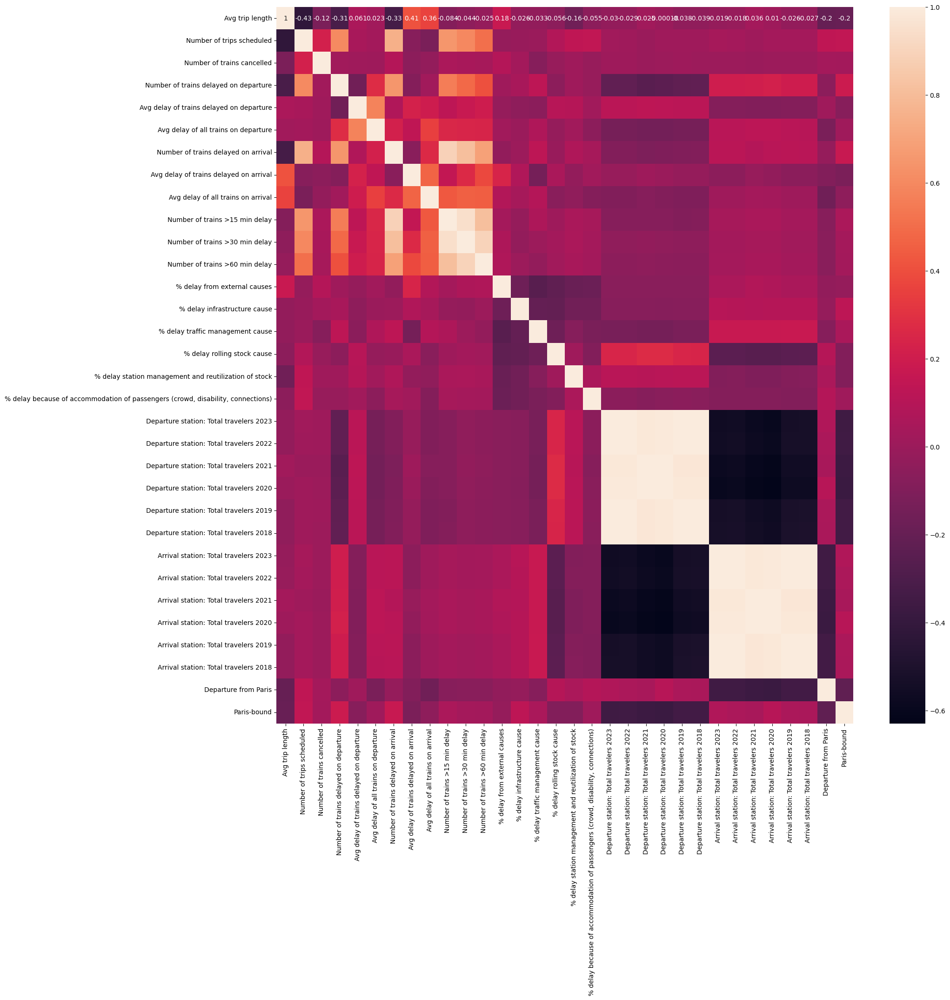

In [7]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(20,20))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(sub.corr(), annot = True, ax = ax)

### Interpretation:
* The total number of travelers in a station for a given year is very strongly correlated with the total number of travelers for the other years. This was to be expected: it means that the more travelers a train station has in 2018, the more it has in 2023 (or any other year). It means the train stations dont shrink or expand widely over span of 5 years that we're studying.
* The total number of travelers at the departure station is negatively correlated with the total number of travelers at the arrival station. Coef if between 0.5 and 0.6, which is fairly strong. It means that in general, trains travel from a small station to a big one, and vice versa. I think it shows that the TGV (high speed train) mostly connects Paris (big train stations with a lot of travelers) to the province cities (smaller train stations)
* Very strong positive correlation between Number of trains delayed > 15 min, Number of trains delayed >30 min and Number of trains delayed >60 min. By the very meaning of those variables, this result is very obvious and expected.
* Same with Number of trains delayed on arrival and Number of trains delayed >15 min, >30 min and >60 min.
* Avg trip length has a fairly strong negative correlation with Number of trips scheduled, and with Number of trains delayed on departure/arrival. The longer the trip, the less frequent the connection. And the longer the trip, the less delay: probably because SNCF has a better, more efficient management for long trips scheduled more sparsely than for shorter, more frequent trips.
* The Number of trains delayed on departure is negatively (but not very strongly) correlated with the Total number of travelers at the departure station. This means that the bigger the train station (in terms of traffic), the less delay to leave that station. Bigger stations probably have a better management than small ones.
* %delay for rolling stock cause is negatively correlated with the Total number of travelers at the arrival station. Again, the more traffic at the station, the better the management of the rolling stock.
* Number of trips scheduled is strongly positively correlated with the number of trains delayed at departure/arrival, and >15 >30 and >60 minutes. It makes sense, as in absolute value, the more trips, the more trains are delayed. Surprisingly, it is less strongly correlated with the number of trains cancelled (about 0.3). 
* Departure from Paris and Paris-bound are correlated respectively with Number of travelers at departure and at arrival. Again, stations in Paris are a lot more busy than others.

# 4. Scatterplot

## 4.1 Between 2023 total travelers in departure and arrival stations

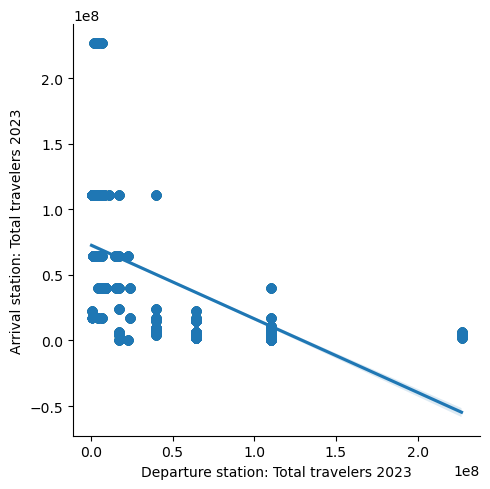

In [8]:
# Create a scatterplot for the "Departure station: Total travelers 2023" and "Arrival station: Total travelers 2023" columns in seaborn

sns.lmplot(x = 'Departure station: Total travelers 2023', y = 'Arrival station: Total travelers 2023', data = sub)

### Interpretation:
* The plot is symetrical because for each train that travels from A to B, it travels back from B to A.
* There are a few "small" stations connected between each other (the dots located below the 0.5 mark) but there are no "big" stations connected between each other. This is because all the big stations are in Paris, and there is no high speed train between them (they are connected with the metro)
* A lot of connections between small stations and medium/big stations.
* There is only one station with more than 20 million travelers in 2023, and it is only connected to a few smaller stations that received 1 or 2 million travelers in 2023.

In [9]:
df2 = df.loc[df['Arrival station: Total travelers 2023'] > 200000000]
df2['Arrival station'].unique()

array(['PARIS GARE DU NORD'], dtype=object)

In [10]:
df2['Departure station'].unique()

array(['DUNKERQUE', 'DOUAI', 'LILLE EUROPE', 'ARRAS'], dtype=object)

This station is Paris gare du Nord, it is famous for being the busiest train station in Europe. In our data set, it is only connected to these 4 stations in the North of France, but it is also connected to London with the Eurostar and to Belgium and Germany (not in our data set because the connections are not provided by SNCF, but by foreign rainway companies)

Note: There are 4 train stations in Paris. Gare du Nord is connected to the North of France, and northen neighbour countries: Gare de l'Est is connected to the East of France and Germany; Gare de Lyon is connected to the South and South-East; and Gare Montparnasse is connectes to the West and South-West. For people who are not familiar with Paris train stations, it might be suprising to see that the busiest train station in Europe is connected to only 4 train stations in the country.

## 4.2 Between Number of trips scheduled and Number of trains delayed on departure

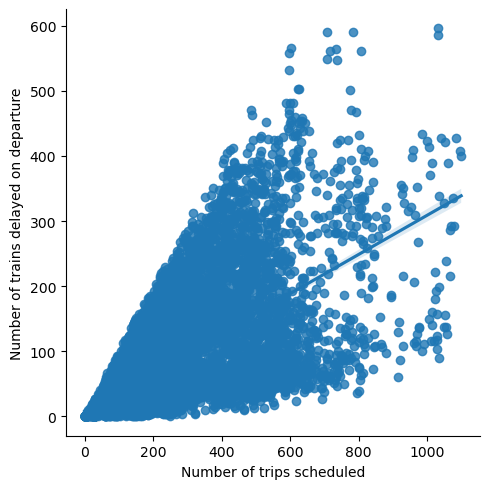

In [11]:
# Create a scatterplot for the "Number of trips scheduled" and "Number of trains delayed on departure" columns in seaborn

sns.lmplot(x = 'Number of trips scheduled', y = 'Number of trains delayed on departure', data = sub)

### Interpretation:
The trend is clearly: The higher the number of trips scheduled, the higher the number of trains that are delayed on departure. But there are many dots that are far away from the trend line, meaning some train lines are a lot more punctual than others.

## 4.3 Between Avg trip length and Number of trips scheduled 

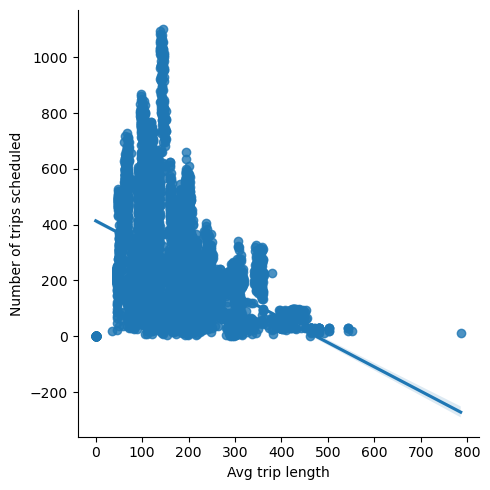

In [12]:
# Create a scatterplot for the "Avg trip length" and "Number of trips scheduled" columns in seaborn

sns.lmplot(x = 'Avg trip length', y = 'Number of trips scheduled', data = sub)

### Interpretation:
* The trend is not linear at all! It is skewed to the right.
* From 0 to 150 min legth, the maximum number of trips scheduled increases with the trip length. And after 160 min, it decreases. But for each trip length, there are actually many dots between 0 and the maximum.
* For trips above 350 min long, the number of trips scheduled is low (100/month or less)


# 5. Pairplot

In [13]:
# Create a pair plot 
g = sns.pairplot(sub)

I have way too many variables for the pairplots to be readable. I'll create a new subset keeping the most relevant variables to be able to interpret it. I will split between "departure" and "arrival" to make it more readable.

In [14]:
# Create a new subset
sub2 = sub.drop(columns = ['Avg delay of all trains on departure', 'Avg delay of all trains on arrival',
                         'Number of trains >15 min delay', 'Number of trains >30 min delay', '% delay from external causes',
                         '% delay infrastructure cause', '% delay traffic management cause','% delay station management and reutilization of stock',
                         '% delay rolling stock cause', 'Number of trains >60 min delay', '% delay because of accommodation of passengers (crowd, disability, connections)',
                         'Departure station: Total travelers 2022', 'Departure station: Total travelers 2021', 'Departure station: Total travelers 2020',
                         'Departure station: Total travelers 2019', 'Departure station: Total travelers 2018', 'Arrival station: Total travelers 2022',
                         'Arrival station: Total travelers 2021', 'Arrival station: Total travelers 2020', 'Arrival station: Total travelers 2019',
                         'Arrival station: Total travelers 2018'])

In [15]:
sub2.columns

Index(['Avg trip length', 'Number of trips scheduled',
       'Number of trains cancelled', 'Number of trains delayed on departure',
       'Avg delay of trains delayed on departure',
       'Number of trains delayed on arrival',
       'Avg delay of trains delayed on arrival',
       'Departure station: Total travelers 2023',
       'Arrival station: Total travelers 2023', 'Departure from Paris',
       'Paris-bound'],
      dtype='object')

In [16]:
# Create subset departure
sub_departure = sub2.drop(columns = ['Number of trains delayed on arrival', 'Avg delay of trains delayed on arrival', 'Arrival station: Total travelers 2023', 'Departure from Paris', 'Paris-bound'])

In [17]:
# Create subset arrival
sub_arrival = sub2.drop(columns = ['Number of trains delayed on departure', 'Avg delay of trains delayed on departure', 'Departure station: Total travelers 2023', 'Departure from Paris', 'Paris-bound'])

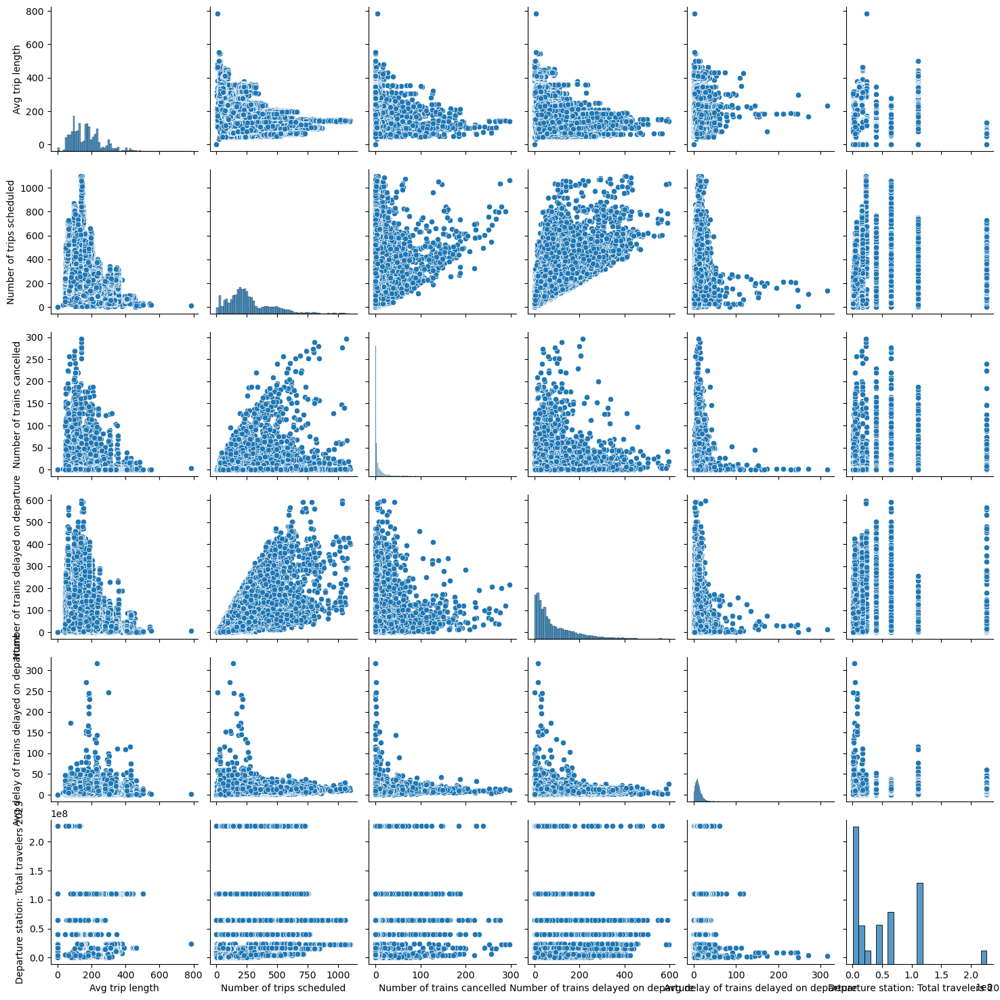

In [18]:
# Create a smaller pair plot for departure
g_departure = sns.pairplot(sub_departure)

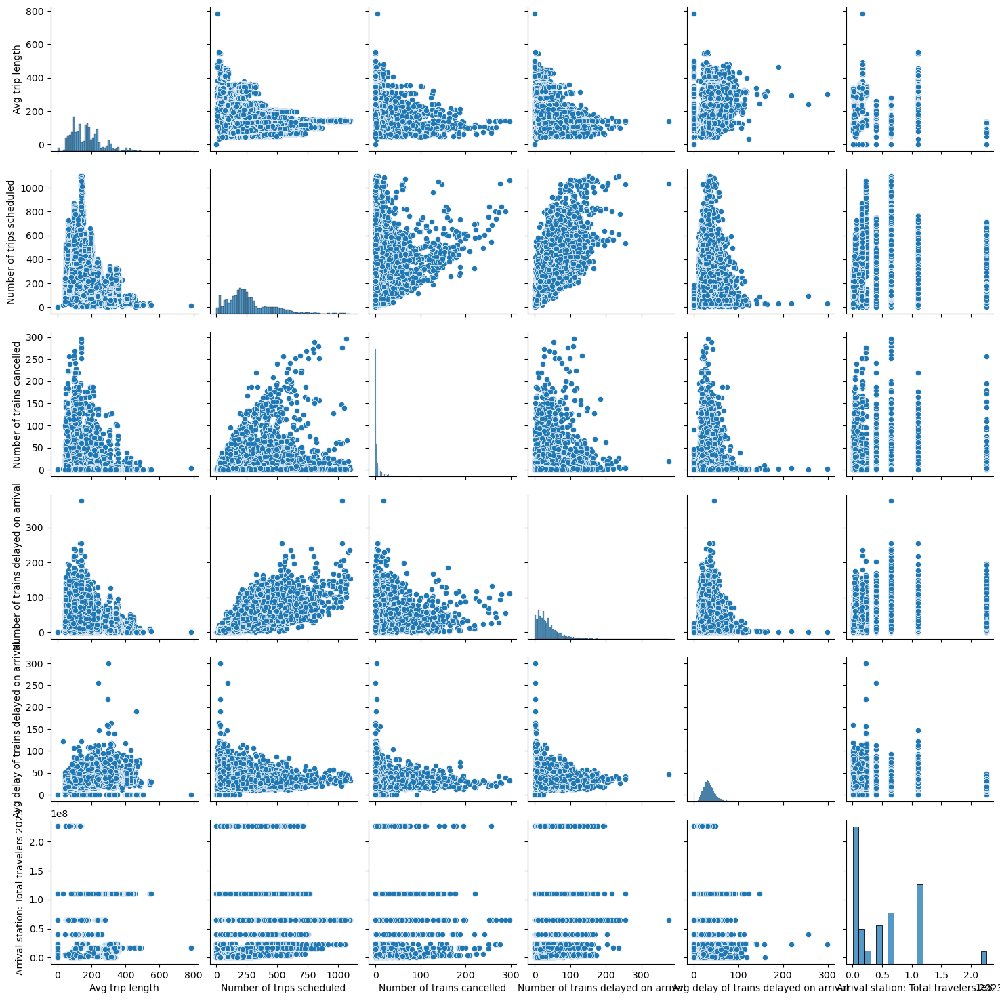

In [19]:
# Create a smaller pair plot for arrival
g_arrival = sns.pairplot(sub_arrival)

### Interpretation:
* The distribution of Nb of trains cancelled and Avg delay of trains delayed on arrival is interesting: I'll explore this relationship later.
* The Number of trains delayed on arrival does not increase or decrease with the number of travelers in the train station.
* Avg delay on departure  is higher in departure train stations with a smaller number of travelers/year.
* Avg delay on arrival is higher in arrival train stations with a smaller number of travelers/year. The busiest stations seem to have a better management and create less delay.

# 6. Categorical plot

<Axes: xlabel='Number of trips scheduled', ylabel='Count'>

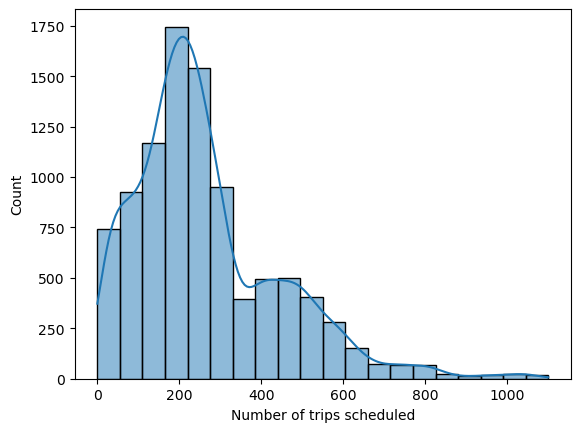

In [20]:
# Create a histogram to visualize the distribution of the variable, to create sensible ferquency ranges.
sns.histplot(df['Number of trips scheduled'], bins = 20, kde = True)

In [21]:
# Creation of frequency flag
df.loc[df['Number of trips scheduled'] < 100, 'Frequency of line'] = 'Low frequency' # Fewer than 3 or 4 connections/day
df.loc[(df['Number of trips scheduled'] >= 100) & (df['Number of trips scheduled'] < 300), 'Frequency of line'] = 'Medium frequency' # Up to 10 connections/day
df.loc[df['Number of trips scheduled'] >= 300, 'Frequency of line'] = 'High frequency' # Over 10 connections/day

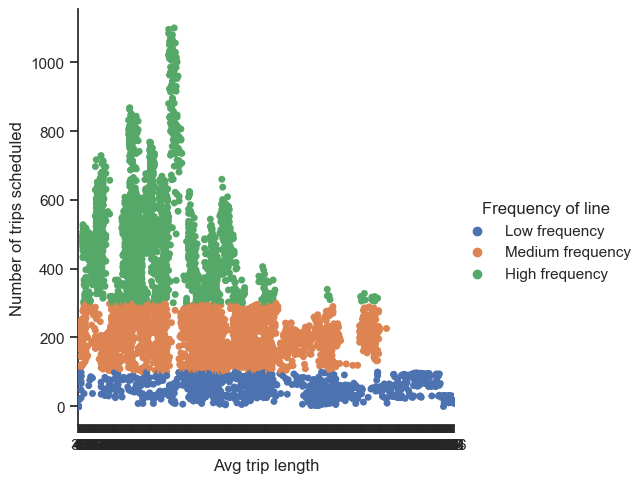

In [22]:
# Create a categorical plot in seaborn using the frequency categories created above
# Checking if Paris-bound trains are more delayed than others
sns.set(style="ticks")
g = sns.catplot(x= 'Avg trip length', y= 'Number of trips scheduled', hue= 'Frequency of line', data=df)

### Interpretation:
Long trips are exlusively low frequency (3-4 max/day)
Only trips that are fairly short are high frequency.

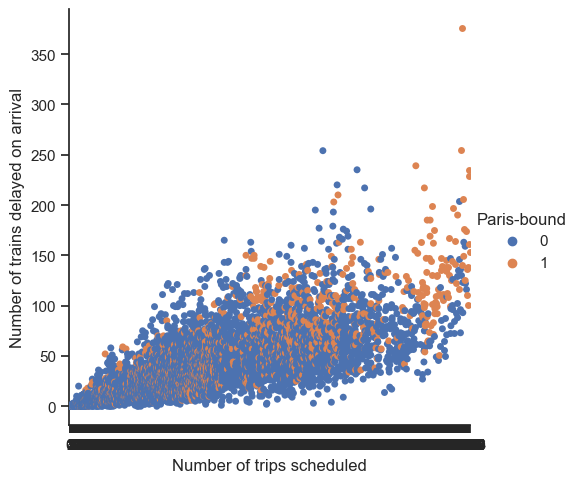

In [23]:
# Create another categorical plot in seaborn
sns.set(style="ticks")
g = sns.catplot(x= 'Number of trips scheduled', y= 'Number of trains delayed on arrival', hue= 'Paris-bound', data=df)

### Interpretation:
I made this chart to see if trains bound to Paris are more delayed on arrival than others.
There is a slightly greater number of orange dots towards the upper right part of the graph, which shows there is a small tendency to it.

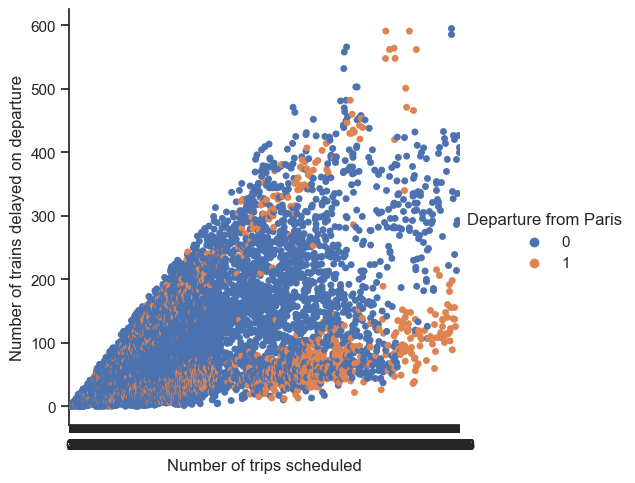

In [24]:
# Create another categorical plot in seaborn
sns.set(style="ticks")
g = sns.catplot(x= 'Number of trips scheduled', y= 'Number of trains delayed on departure', hue= 'Departure from Paris', data=df)

### Interpretation:
I made this chart to see if trains leaving from Paris are more delayed on departure than others.
The orange dots are concentrated on the lower part of the graph, and on the top part, but not in the middle. It shows that connections from Paris have a high proportion of punctuality, or a very high one, but not a medium one.
My hypothesis is that there is one or two parisian stations that have a tendency to create more delay on departure than the others. I'l try to identify them later on.

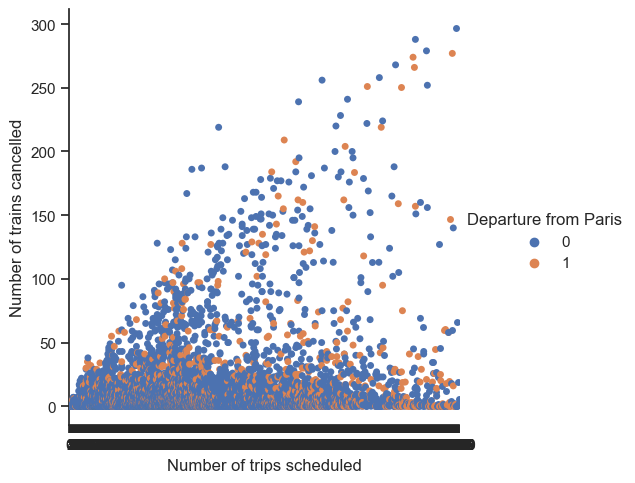

In [25]:
# Now check cancellations
sns.set(style="ticks")
g = sns.catplot(x= 'Number of trips scheduled', y= 'Number of trains cancelled', hue= 'Departure from Paris', data=df)

# 7. Conclusion

## Insights drown from the visualizations
* The Number of trains delayed on departure/arrival is not affected the number of travelers in the train station.

I didn't answer many of the questions I formulated previously as most of them were based on regions: I need to create more plots based on this categorical variable.

## Hypothesis to test in the next steps
- There is one or two parisian stations that have a tendency to create more delay on departure than the others.
- The average delay varies between regions.
- Train stations in Paris have a different management than provincial ones, creating a different result in delay.
